In [ ]:
# check the version of python
from platform import python_version

print(python_version())

In [ ]:
# conda install -c conda-forge movingpandas

In [ ]:
# check if it works
import movingpandas as mpd
print(mpd.__version__)

## movingpandas: create trajectory and identify significant points

In [1]:
# import the packages we need
import pandas as pd
import geopandas as gpd
import movingpandas as mpd
from shapely.geometry import Point
from datetime import datetime
from pyproj import CRS
import numpy as np
import plotly.express as px
from datetime import timedelta
import os

In [ ]:
# df=pd.read_csv('Data/london_mobile_sample.csv')
# df.head(4)

# filter out rows that muptiple users share the same location
# cleaned_df=df[df.groupby(['latitude','longitude']).device_id.transform('nunique') == 1]
# df[df.Y.map(df.groupby('Y').X.nunique()) == 1]

# # rename the column name
# cleaned_df.rename({'sdk_ts':'timestamp'}, axis='columns',inplace= True)
# cleaned_df.head(5)


# # convert to datatime
# cleaned_df['time'] = pd.to_datetime(cleaned_df['timestamp'],
#                                     utc='False')
# cleaned_df.head(2)

# # save the cleaned dataset
# import os
# path=os. getcwd() 
# out_dir = path+"/output" 
# if not os.path.exists(out_dir):
#     os.makedirs(out_dir)

# route_out = os.path.join(out_dir,"cleaned_dataset.csv" )
# cleaned_df.to_csv(route_out, index=False)

### cleaned dataset

In [2]:
cleaned_df=pd.read_csv('output/cleaned_dataset.csv')
cleaned_df.head(4)

,device_id,timestamp,latitude,longitude,accuracy,c20,device_os,device_os_version,time
0,P36y1xOjPestv/5UJb8Xl0sOi84=,2021-04-06 05:32:32.592 UTC,51.520138,-0.174266,4.937588,5221390167779049472,iOS,14.4,2021-04-06 05:32:32.592000+00:00
1,7tFPjHJbRzGLRJ24cGJvo3YG3/Q=,2021-04-06 05:48:51.631 UTC,51.521901,-0.159715,65.000000,5221390269572710400,iOS,14.4,2021-04-06 05:48:51.631000+00:00
2,xh7MUpuDzmhHZTdmXjAw/qqpFwM=,2021-04-05 06:02:59 UTC,51.548767,-0.184158,1.000000,5221389968125984768,iOS,NaN,2021-04-05 06:02:59+00:00
3,96WI6ATx7vT1FuYGKnbxFbWkTJ0=,2021-04-05 22:24:56.383 UTC,51.521532,-0.080181,11.304000,5221392367037186048,Android,11,2021-04-05 22:24:56.383000+00:00


In [3]:
#check the number of user id
len(list(cleaned_df.device_id.unique()))

45509

In [4]:
cleaned_gdf = gpd.GeoDataFrame(cleaned_df, geometry=gpd.points_from_xy(cleaned_df.longitude, cleaned_df.latitude))
cleaned_gdf.set_crs(epsg=4326, inplace=True)
cleaned_gdf.to_crs(epsg=27700)

,device_id,timestamp,latitude,longitude,accuracy,c20,device_os,device_os_version,time,geometry
0,P36y1xOjPestv/5UJb8Xl0sOi84=,2021-04-06 05:32:32.592 UTC,51.520138,-0.174266,4.937588,5221390167779049472,iOS,14.4,2021-04-06 05:32:32.592000+00:00,POINT (526767.174 181714.930)
1,7tFPjHJbRzGLRJ24cGJvo3YG3/Q=,2021-04-06 05:48:51.631 UTC,51.521901,-0.159715,65.000000,5221390269572710400,iOS,14.4,2021-04-06 05:48:51.631000+00:00,POINT (527771.717 181936.262)
2,xh7MUpuDzmhHZTdmXjAw/qqpFwM=,2021-04-05 06:02:59 UTC,51.548767,-0.184158,1.000000,5221389968125984768,iOS,NaN,2021-04-05 06:02:59+00:00,POINT (526001.859 184881.464)
3,96WI6ATx7vT1FuYGKnbxFbWkTJ0=,2021-04-05 22:24:56.383 UTC,51.521532,-0.080181,11.304000,5221392367037186048,Android,11,2021-04-05 22:24:56.383000+00:00,POINT (533290.200 182037.018)
4,deQUFy0pnZEac6sl40zjAOc6uKw=,2021-04-06 05:57:22.378 UTC,51.513419,-0.092389,12.141000,5221364481938948096,Android,11,2021-04-06 05:57:22.378000+00:00,POINT (532466.872 181112.603)
...,...,...,...,...,...,...,...,...,...,...
3580935,eOMgCSz2cIeQRkqtJg5a1yyiJ4s=,2021-04-10 17:26:43 UTC,51.487257,-0.178955,15.300000,5221366752374423552,Android,NaN,2021-04-10 17:26:43+00:00,POINT (526532.886 178050.401)
3580936,zHPoyPAUrcZJw1GFZt18bUmz9TA=,2021-04-10 17:50:48 UTC,51.495489,-0.143383,26.400000,5221366454209740800,Android,NaN,2021-04-10 17:50:48+00:00,POINT (528979.250 179027.833)
3580937,+Dc+u01eovqM9Y/7/Nbo+0hoTMo=,2021-04-10 17:05:19 UTC,51.536936,-0.116663,37.300000,5221390963186860032,iOS,14,2021-04-10 17:05:19+00:00,POINT (530715.278 183684.144)
3580938,z/TXViPeXmtiBJ23CjJLLzlXa80=,2021-04-10 17:06:49 UTC,51.495635,-0.093958,11.400000,5221365905204707328,iOS,14.4.2,2021-04-10 17:06:49+00:00,POINT (532409.521 179132.232)


### select one day 

In [5]:
# filter the date we want
start_date = "2021-04-10 00:00:00"
end_date = "2021-04-11 00:00:00"

after_start_date = cleaned_gdf["timestamp"] >= start_date
before_end_date = cleaned_gdf["timestamp"] <= end_date
between_two_dates = after_start_date & before_end_date
filtered_dates = cleaned_gdf.loc[between_two_dates]
filtered_dates

,device_id,timestamp,latitude,longitude,accuracy,c20,device_os,device_os_version,time,geometry
459,/BgI2/Ftb+KW5AGkQjvkRkeofWk=,2021-04-10 13:03:12 UTC,51.501895,-0.208781,8.0,5221378308504027136,iOS,NaN,2021-04-10 13:03:12+00:00,POINT (-0.20878 51.50189)
460,Lo+KeeCs90HH84RrRREz+2aJEzM=,2021-04-10 10:04:28 UTC,51.480898,-0.131072,57.6,5221366293926510592,iOS,14.4.1,2021-04-10 10:04:28+00:00,POINT (-0.13107 51.48090)
461,ZuzNU90ZOq1s+0RWGhKdVbCvBGI=,2021-04-10 10:27:20 UTC,51.476744,-0.138372,65.0,5221366308522688512,iOS,Other,2021-04-10 10:27:20+00:00,POINT (-0.13837 51.47674)
462,psfhvoD7YguzlPaUgQWkWCRQ/PY=,2021-04-10 10:25:08 UTC,51.556366,-0.116422,12.9,5221391008862830592,Android,NaN,2021-04-10 10:25:08+00:00,POINT (-0.11642 51.55637)
463,F2Ucng9D04eZVzhLVEbI9TUPvTc=,2021-04-10 10:06:05 UTC,51.545970,-0.169492,17.3,5221390032594534400,Android,NaN,2021-04-10 10:06:05+00:00,POINT (-0.16949 51.54597)
...,...,...,...,...,...,...,...,...,...,...
3580935,eOMgCSz2cIeQRkqtJg5a1yyiJ4s=,2021-04-10 17:26:43 UTC,51.487257,-0.178955,15.3,5221366752374423552,Android,NaN,2021-04-10 17:26:43+00:00,POINT (-0.17896 51.48726)
3580936,zHPoyPAUrcZJw1GFZt18bUmz9TA=,2021-04-10 17:50:48 UTC,51.495489,-0.143383,26.4,5221366454209740800,Android,NaN,2021-04-10 17:50:48+00:00,POINT (-0.14338 51.49549)
3580937,+Dc+u01eovqM9Y/7/Nbo+0hoTMo=,2021-04-10 17:05:19 UTC,51.536936,-0.116663,37.3,5221390963186860032,iOS,14,2021-04-10 17:05:19+00:00,POINT (-0.11666 51.53694)
3580938,z/TXViPeXmtiBJ23CjJLLzlXa80=,2021-04-10 17:06:49 UTC,51.495635,-0.093958,11.4,5221365905204707328,iOS,14.4.2,2021-04-10 17:06:49+00:00,POINT (-0.09396 51.49564)


In [6]:
filtered_dates['time'] = pd.to_datetime(filtered_dates['timestamp'],
                                    utc='False')

/Users/zhangjiawei/opt/anaconda3/envs/sds2020/lib/python3.7/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [7]:
# cleaned_df['time'] = pd.to_datetime(cleaned_df['timestamp'], 
#                                     format='%d/%m/%Y %H:%M:%S')

In [8]:
#drop useless columns
filtered_dates.drop(['accuracy','c20','device_os','device_os_version'], 
                    axis='columns', inplace=True)

/Users/zhangjiawei/opt/anaconda3/envs/sds2020/lib/python3.7/site-packages/pandas/core/frame.py:4312: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### create trajectory, start with some samples

In [9]:
# test with some sample
sample_df = filtered_dates.sample(n=10000)
# len(list(sample_df.device_id.unique()))

In [10]:
# set index
sample_df = sample_df.set_index('time')
sample_df.head(7)

,device_id,timestamp,latitude,longitude,geometry
time,,,,,
2021-04-10 10:55:41+00:00,bYWz42Iztab7rjfBfgrcY0NXCFA=,2021-04-10 10:55:41 UTC,51.549224,-0.129681,POINT (-0.12968 51.54922)
2021-04-10 11:46:28+00:00,wNROt5Z2Jcru5gZ/xtGOmOsrnAI=,2021-04-10 11:46:28 UTC,51.501678,-0.161632,POINT (-0.16163 51.50168)
2021-04-10 12:40:25+00:00,unK2+Rhgf/EsSpQcsT3k5jGrS5w=,2021-04-10 12:40:25 UTC,51.492710,-0.185784,POINT (-0.18578 51.49271)
2021-04-10 08:53:02+00:00,nFxP1dFjyNyacYQPXL28Aagv5xo=,2021-04-10 08:53:02 UTC,51.548397,-0.146283,POINT (-0.14628 51.54840)
2021-04-10 10:28:27+00:00,2ETsMqgdnRERNNwRduExFMTcJWg=,2021-04-10 10:28:27 UTC,51.515321,-0.166014,POINT (-0.16601 51.51532)
2021-04-10 08:30:55+00:00,Q3WQF4BPgSrjQIGwEzw6cZ3GNjQ=,2021-04-10 08:30:55 UTC,51.513430,-0.171354,POINT (-0.17135 51.51343)
2021-04-10 08:40:00+00:00,sF9SWiJkwIhw/mHiok15PYqxQDM=,2021-04-10 08:40:00 UTC,51.521633,-0.090873,POINT (-0.09087 51.52163)


In [11]:
# # set index
# filtered_dates = filtered_dates.set_index('time')
# filtered_dates.head(7)

In [12]:
# create collection of trajectories
minimum_length = 300 
collection = mpd.TrajectoryCollection(sample_df, 'device_id', min_length=minimum_length) #(in meters)
#Shorter trajectories are discarded.

collection

TrajectoryCollection with 1444 trajectories

In [13]:
for trajectory in collection.trajectories:
    # Calculate speed
    trajectory.add_speed(overwrite=True)
    
    # Determine direction of movement
    trajectory.add_direction(overwrite=True)
    
    # Let's first check only the first trajectory (i.e. stop iteration after first run)
    break

In [14]:
trajectory.df.head()

,device_id,timestamp,latitude,longitude,geometry,speed,prev_pt,direction
time,,,,,,,,
2021-04-10 13:44:40+00:00,+13qS+qrnZziDyoSjXG91YgtKjc=,2021-04-10 13:44:40 UTC,51.487565,-0.162624,POINT (-0.16262 51.48756),0.268485,None,282.225712
2021-04-10 16:30:28+00:00,+13qS+qrnZziDyoSjXG91YgtKjc=,2021-04-10 16:30:28 UTC,51.492630,-0.200213,POINT (-0.20021 51.49263),0.268485,POINT (-0.16262 51.48756),282.225712


In [15]:
trajectory.hvplot(frame_height=400, frame_width=400)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]

In [16]:
# for all trajectory

trajectories = gpd.GeoDataFrame()

i = 0
for trajectory in collection.trajectories:
    # Calculate speed
    trajectory.add_speed(overwrite=True)
    
    # Determine direction of movement
    trajectory.add_direction(overwrite=True)
    
    # Parse time component (as datetime)
    trajectory.df["t"] = pd.to_datetime(trajectory.df["timestamp"])
    
    # Add unique id for each trajectory
    trajectory.df["tid"] = i
    
    # Add to container
    trajectories = trajectories.append(trajectory.df)
    i+=1
    
# Reorder the data based on timestamp
trajectories = trajectories.sort_values(by="t").reset_index(drop=True)

In [17]:
# Plot them all (use trajectory id to separate trajectories)
fig = px.line_3d(trajectories, x="longitude", y="latitude", z="t", color='device_id')
fig.update_traces(line=dict(width=5))

# Want to get background map as well? It is possible:
# https://chart-studio.plotly.com/~empet/14397/plotly-plot-of-a-map-from-data-available/#/

fig.show()

### Aggregate trajectories identifying  significant points 

In [18]:
# Aggregate trajectories identifying  significant points (start and end) 
# Method description: 
#https://movingpandas.readthedocs.io/en/latest/trajectoryaggregator.html
agg = mpd.TrajectoryCollectionAggregator(collection,
                                         min_distance=300,
                                         max_distance=2000, 
                                         min_stop_duration
                                         =timedelta(minutes=10))

In [19]:
# Get flows and clusters
flows = agg.get_flows_gdf() 
clusters = agg.get_clusters_gdf()
points = agg.get_significant_points_gdf()

In [20]:
flows #the number of trajectories summarized in the flow (weight)

,geometry,weight
0,"LINESTRING (-0.16551 51.48515, -0.19769 51.50153)",2
1,"LINESTRING (-0.17042 51.52233, -0.18212 51.54135)",22
2,"LINESTRING (-0.19173 51.50125, -0.15492 51.50777)",4
3,"LINESTRING (-0.17042 51.52233, -0.15492 51.50777)",15
4,"LINESTRING (-0.11334 51.50860, -0.12020 51.48518)",5
...,...,...
422,"LINESTRING (-0.16551 51.48515, -0.11374 51.55110)",1
423,"LINESTRING (-0.11374 51.55110, -0.18212 51.54135)",1
424,"LINESTRING (-0.19943 51.52261, -0.09978 51.51736)",1
425,"LINESTRING (-0.08165 51.52347, -0.15689 51.53787)",1


In [21]:
clusters #the number of clustered significant points (n)

,geometry,n
0,POINT (-0.16551 51.48515),140
1,POINT (-0.19173 51.50125),0
2,POINT (-0.17042 51.52233),311
3,POINT (-0.18212 51.54135),195
4,POINT (-0.15492 51.50777),236
5,POINT (-0.11374 51.55110),102
6,POINT (-0.11334 51.50860),177
7,POINT (-0.12020 51.48518),208
8,POINT (-0.08165 51.52347),174
9,POINT (-0.14140 51.52883),193


In [22]:
points #extracted significant points

,geometry
0,POINT (-0.16262 51.48756)
1,POINT (-0.20021 51.49263)
2,POINT (-0.19795 51.50600)
3,POINT (-0.20770 51.50678)
4,POINT (-0.17784 51.52445)
...,...
4190,POINT (-0.11869 51.50032)
4191,POINT (-0.10661 51.49857)
4192,POINT (-0.12048 51.50084)
4193,POINT (-0.12685 51.50770)


In [22]:
# Plot with Holoviews
( flows.hvplot(title='Generalized aggregated trajectories',
               geo=True, hover_cols=['weight'], line_width='weight',
               alpha=0.5, color='#1f77b3', tiles='OSM', frame_height=400, 
               frame_width=400) * clusters.hvplot(geo=True, color='red', size='n') )

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]   (weight)
   .Points.I :Points   [Longitude,Latitude]   (n)

In [21]:
# Plot with Holoviews
( flows.hvplot(title='Generalized aggregated trajectories',
               geo=True, hover_cols=['weight'], line_width='weight',
               alpha=0.5, color='#1f77b3', tiles='OSM', frame_height=400, 
               frame_width=400) * points.hvplot(geo=True, color='red', size=20) )

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]   (weight)
   .Points.I :Points   [Longitude,Latitude]

### network (build a edgelist)

In [23]:
# build a network from flow
import networkx as nx

flows['points'] = flows.apply(lambda x: [y for y in x['geometry'].coords], axis=1)
flows

,geometry,weight,points
0,"LINESTRING (-0.16551 51.48515, -0.19769 51.50153)",2,"[(-0.16550783459459464, 51.48515478547297), (-..."
1,"LINESTRING (-0.17042 51.52233, -0.18212 51.54135)",22,"[(-0.1704231579872205, 51.522332122108644), (-..."
2,"LINESTRING (-0.19173 51.50125, -0.15492 51.50777)",4,"[(-0.19173367849056608, 51.50124693528303), (-..."
3,"LINESTRING (-0.17042 51.52233, -0.15492 51.50777)",15,"[(-0.1704231579872205, 51.522332122108644), (-..."
4,"LINESTRING (-0.11334 51.50860, -0.12020 51.48518)",5,"[(-0.11333893309644676, 51.50859955167512), (-..."
...,...,...,...
422,"LINESTRING (-0.16551 51.48515, -0.11374 51.55110)",1,"[(-0.16550783459459464, 51.48515478547297), (-..."
423,"LINESTRING (-0.11374 51.55110, -0.18212 51.54135)",1,"[(-0.1137444374757282, 51.551101429514574), (-..."
424,"LINESTRING (-0.19943 51.52261, -0.09978 51.51736)",1,"[(-0.19942687737556553, 51.5226061724434), (-0..."
425,"LINESTRING (-0.08165 51.52347, -0.15689 51.53787)",1,"[(-0.08164613472527471, 51.52347004181318), (-..."


In [24]:
# extract origin and destination from linestring
flows['origin'] = [i[0] for i in flows['points']]
flows['target'] = [i[1] for i in flows['points']]

In [25]:
flows

,geometry,weight,points,origin,target
0,"LINESTRING (-0.16551 51.48515, -0.19769 51.50153)",2,"[(-0.16550783459459464, 51.48515478547297), (-...","(-0.16550783459459464, 51.48515478547297)","(-0.19768699918604632, 51.50153123529074)"
1,"LINESTRING (-0.17042 51.52233, -0.18212 51.54135)",22,"[(-0.1704231579872205, 51.522332122108644), (-...","(-0.1704231579872205, 51.522332122108644)","(-0.18212229398989904, 51.54135179590905)"
2,"LINESTRING (-0.19173 51.50125, -0.15492 51.50777)",4,"[(-0.19173367849056608, 51.50124693528303), (-...","(-0.19173367849056608, 51.50124693528303)","(-0.1549198696511628, 51.50776639437985)"
3,"LINESTRING (-0.17042 51.52233, -0.15492 51.50777)",15,"[(-0.1704231579872205, 51.522332122108644), (-...","(-0.1704231579872205, 51.522332122108644)","(-0.1549198696511628, 51.50776639437985)"
4,"LINESTRING (-0.11334 51.50860, -0.12020 51.48518)",5,"[(-0.11333893309644676, 51.50859955167512), (-...","(-0.11333893309644676, 51.50859955167512)","(-0.1201966721531101, 51.485184197320585)"
...,...,...,...,...,...
422,"LINESTRING (-0.16551 51.48515, -0.11374 51.55110)",1,"[(-0.16550783459459464, 51.48515478547297), (-...","(-0.16550783459459464, 51.48515478547297)","(-0.1137444374757282, 51.551101429514574)"
423,"LINESTRING (-0.11374 51.55110, -0.18212 51.54135)",1,"[(-0.1137444374757282, 51.551101429514574), (-...","(-0.1137444374757282, 51.551101429514574)","(-0.18212229398989904, 51.54135179590905)"
424,"LINESTRING (-0.19943 51.52261, -0.09978 51.51736)",1,"[(-0.19942687737556553, 51.5226061724434), (-0...","(-0.19942687737556553, 51.5226061724434)","(-0.0997849747222222, 51.51736435194444)"
425,"LINESTRING (-0.08165 51.52347, -0.15689 51.53787)",1,"[(-0.08164613472527471, 51.52347004181318), (-...","(-0.08164613472527471, 51.52347004181318)","(-0.15688686960000003, 51.53787333799999)"


In [26]:
# # reverse key and value 
# o_map = {value : key for (key, value) in o_map['origin'].items()}
# d_map = {value : key for (key, value) in d_map['target'].items()}

### network!

In [54]:
# network !!
g_OD = nx.from_pandas_edgelist(flows, 'origin', 'target',['weight'])
list(g_OD.edges(data=True))[:3]
# # get position
# pos_shp = {xy: xy for xy in g_OD.nodes()}

[((-0.16550783459459464, 51.48515478547297),
  (-0.19768699918604632, 51.50153123529074),
  {'weight': 2}),
 ((-0.16550783459459464, 51.48515478547297),
  (-0.09947397194736844, 51.49303415284212),
  {'weight': 3}),
 ((-0.16550783459459464, 51.48515478547297),
  (-0.14050801586776854, 51.48950061723143),
  {'weight': 8})]

In [55]:
# Create a new attribute with node coordinates (now coord are the keys and we do not want to lose that information
nod_coord = {(e1):e1 for e1 in g_OD.nodes()}
nx.set_node_attributes(g_OD,nod_coord,'point_location')
list(g_OD.nodes(data=True))[0:2]

[((-0.16550783459459464, 51.48515478547297),
  {'point_location': (-0.16550783459459464, 51.48515478547297)}),
 ((-0.19768699918604632, 51.50153123529074),
  {'point_location': (-0.19768699918604632, 51.50153123529074)})]

In [56]:
# now relabel each node with an ordered integer:
node_list = list(g_OD.nodes())
mapping = {node_list[i]:i for i in range(len(node_list))}
g_OD = nx.relabel_nodes(g_OD, mapping)
list(g_OD.nodes(data=True))

[(0, {'point_location': (-0.16550783459459464, 51.48515478547297)}),
 (1, {'point_location': (-0.19768699918604632, 51.50153123529074)}),
 (2, {'point_location': (-0.1704231579872205, 51.522332122108644)}),
 (3, {'point_location': (-0.18212229398989904, 51.54135179590905)}),
 (4, {'point_location': (-0.19173367849056608, 51.50124693528303)}),
 (5, {'point_location': (-0.1549198696511628, 51.50776639437985)}),
 (6, {'point_location': (-0.11333893309644676, 51.50859955167512)}),
 (7, {'point_location': (-0.1201966721531101, 51.485184197320585)}),
 (8, {'point_location': (-0.08164613472527471, 51.52347004181318)}),
 (9, {'point_location': (-0.13083171914979763, 51.511097109554655)}),
 (10, {'point_location': (-0.14139788550239232, 51.528827917799056)}),
 (11, {'point_location': (-0.13919800326241136, 51.548336980283686)}),
 (12, {'point_location': (-0.17480911773109234, 51.499593735378134)}),
 (13, {'point_location': (-0.1137444374757282, 51.551101429514574)}),
 (14, {'point_location': (-

In [57]:
list(g_OD.edges(data=True))[:3]

[(0, 1, {'weight': 2}), (0, 15, {'weight': 3}), (0, 18, {'weight': 8})]

In [58]:
# set edge attribute with coordinates
edg_coord1={(e1,e2):(g_OD.nodes[e1]['point_location']) for e1, e2 in g_OD.edges()}
edg_coord2={(e1,e2):(g_OD.nodes[e2]['point_location']) for e1, e2 in g_OD.edges()}

nx.set_edge_attributes(g_OD,edg_coord1,'origin_coord')
nx.set_edge_attributes(g_OD,edg_coord2,'target_coord')
list(g_OD.edges(data=True))[:3]

[(0,
  1,
  {'weight': 2,
   'origin_coord': (-0.16550783459459464, 51.48515478547297),
   'target_coord': (-0.19768699918604632, 51.50153123529074)}),
 (0,
  15,
  {'weight': 3,
   'origin_coord': (-0.16550783459459464, 51.48515478547297),
   'target_coord': (-0.09947397194736844, 51.49303415284212)}),
 (0,
  18,
  {'weight': 8,
   'origin_coord': (-0.16550783459459464, 51.48515478547297),
   'target_coord': (-0.14050801586776854, 51.48950061723143)})]

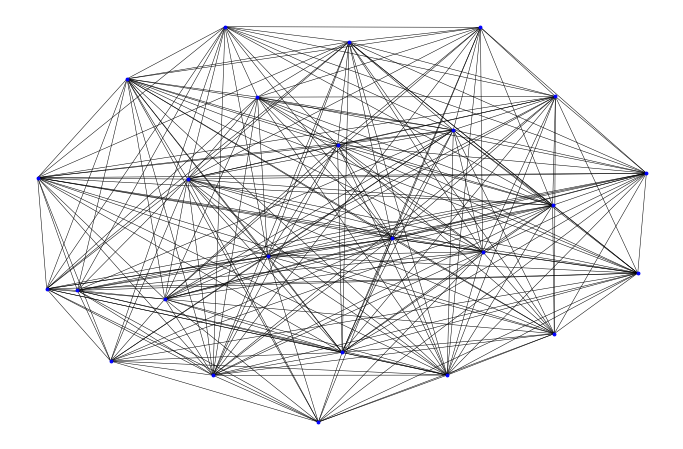

In [59]:
# plot the network!


pos = {e1: xy for e1,xy in g_OD.nodes(data='point_location')}

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12,8))
nx.draw_networkx_nodes(g_OD,pos,node_size=8,node_color='b')
nx.draw_networkx_edges(g_OD,pos,arrows=False,width=0.5)
plt.axis("off")
plt.show()

In [62]:
# save the network to shp
df = nx.to_pandas_edgelist(g_OD)
#to_pandas_edgelist(Graph, source='source', target='target', nodelist=None, dtype=None, order=None)

df.head(3)

,source,target,origin_coord,weight,target_coord
0,0,1,"(-0.16550783459459464, 51.48515478547297)",2,"(-0.19768699918604632, 51.50153123529074)"
1,0,15,"(-0.16550783459459464, 51.48515478547297)",3,"(-0.09947397194736844, 51.49303415284212)"
2,0,18,"(-0.16550783459459464, 51.48515478547297)",8,"(-0.14050801586776854, 51.48950061723143)"


In [63]:
import os
path=os. getcwd() 
out_dir = path+"/output" 
route_out = os.path.join(out_dir,"weighed_network.csv" )
df.to_csv(route_out, index=False)

### matrix: inflow and outflow

In [93]:
# read in the weighed network to dataframe
df=pd.read_csv('output/weighed_network.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   source        249 non-null    int64 
 1   target        249 non-null    int64 
 2   origin_coord  249 non-null    object
 3   weight        249 non-null    int64 
 4   target_coord  249 non-null    object
dtypes: int64(3), object(2)
memory usage: 9.9+ KB


In [94]:
# # calculate the in-flow and out-flow

# df['outflow']=df.groupby('source')['weight'].transform('sum')
# df['inflow']=df.groupby('target')['weight'].transform('sum')
# df

In [116]:
outflow=df.groupby(['source','origin_coord']).weight.agg(['sum']).reset_index()
inflow=df.groupby(['target','target_coord']).weight.agg(['sum']).reset_index()
outflow.head(2)

# convert data type from str to list
inflow.target_coord= inflow.target_coord.str.replace('(','')
inflow.target_coord= inflow.target_coord.str.replace(')','')
inflow.target_coord= inflow.target_coord.str.split(',')
# convert data type from str to list
outflow.origin_coord= outflow.origin_coord.str.replace('(','')
outflow.origin_coord= outflow.origin_coord.str.replace(')','')
outflow.origin_coord= outflow.origin_coord.str.split(',')
outflow

#extract lat and lon
outflow['lon']=0
outflow['lat']=0

for i in outflow.index:
    outflow['lon'][i]=outflow['origin_coord'][i][0] 
    outflow['lat'][i]=outflow['origin_coord'][i][1] 
outflow

#extract lat and lon
inflow['lon']=0
inflow['lat']=0

for i in inflow.index:
    inflow['lon'][i]=inflow['target_coord'][i][0] 
    inflow['lat'][i]=inflow['target_coord'][i][1] 


# set geometry
inflow = gpd.GeoDataFrame(
    inflow, geometry=gpd.points_from_xy(inflow.lon, inflow.lat,crs="EPSG:4326"))

outflow = gpd.GeoDataFrame(
    outflow, geometry=gpd.points_from_xy(outflow.lon, outflow.lat,crs="EPSG:4326"))

outflow

/Users/zhangjiawei/opt/anaconda3/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  
/Users/zhangjiawei/opt/anaconda3/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  import sys
/Users/zhangjiawei/opt/anaconda3/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  # Remove the CWD from sys.path while we load stuff.
/Users/zhangjiawei/opt/anacon

,source,origin_coord,sum,lon,lat,geometry
0,0,"[-0.16550783459459464, 51.48515478547297]",67,-0.16550783459459464,51.48515478547297,POINT (-0.16551 51.48515)
1,1,"[-0.19768699918604632, 51.50153123529074]",48,-0.19768699918604632,51.50153123529074,POINT (-0.19769 51.50153)
2,2,"[-0.1704231579872205, 51.522332122108644]",139,-0.1704231579872205,51.522332122108644,POINT (-0.17042 51.52233)
3,3,"[-0.18212229398989904, 51.54135179590905]",55,-0.18212229398989904,51.54135179590905,POINT (-0.18212 51.54135)
4,4,"[-0.19173367849056608, 51.50124693528303]",32,-0.19173367849056608,51.50124693528303,POINT (-0.19173 51.50125)
5,5,"[-0.1549198696511628, 51.50776639437985]",91,-0.1549198696511628,51.50776639437985,POINT (-0.15492 51.50777)
6,6,"[-0.11333893309644676, 51.50859955167512]",85,-0.11333893309644676,51.50859955167512,POINT (-0.11334 51.50860)
7,7,"[-0.1201966721531101, 51.485184197320585]",63,-0.1201966721531101,51.485184197320585,POINT (-0.12020 51.48518)
8,8,"[-0.08164613472527471, 51.52347004181318]",51,-0.08164613472527471,51.52347004181318,POINT (-0.08165 51.52347)
9,9,"[-0.13083171914979763, 51.511097109554655]",50,-0.13083171914979763,51.511097109554655,POINT (-0.13083 51.51110)


<AxesSubplot:>

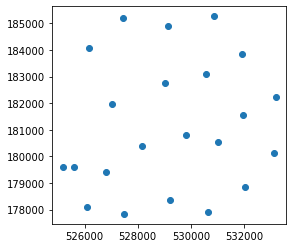

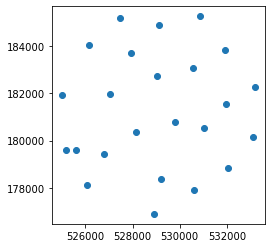

In [117]:
outflow=outflow.to_crs("EPSG:27700")
outflow.plot()

inflow=inflow.to_crs("EPSG:27700")
inflow.plot()

### join values to polygon

In [118]:
# load in ward data
london_wards = gpd.read_file(f"data/statistical-gis-boundaries-london/ESRI/London_Ward.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
london_wards=london_wards.to_crs('epsg:27700')
london_wards.crs

<Projected CRS: EPSG:27700>
Name: OSGB 1936 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: UK - Britain and UKCS 49°45'N to 61°N, 9°W to 2°E
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: OSGB 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

TypeError: unsupported operand type(s) for +: 'AxesSubplot' and 'AxesSubplot'

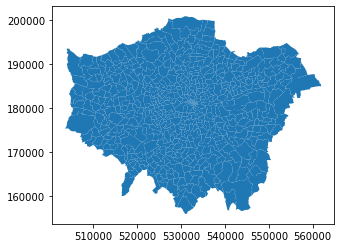

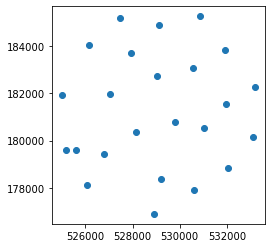

In [119]:
london_wards.plot()
inflow.plot()

In [123]:
flow = gpd.sjoin(inflow,london_wards, 
                         how="right", 
                         op='within')
flow

,index_left,target,target_coord,sum,lon,lat,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,geometry
0,NaN,NaN,NaN,NaN,NaN,NaN,Chessington South,E05000405,755.173,0.0,E09000021,Kingston upon Thames,50840,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,NaN,NaN,NaN,NaN,NaN,NaN,Tolworth and Hook Rise,E05000414,259.464,0.0,E09000021,Kingston upon Thames,117160,"POLYGON ((517829.600 165447.100, 517837.100 16..."
2,NaN,NaN,NaN,NaN,NaN,NaN,Berrylands,E05000401,145.390,0.0,E09000021,Kingston upon Thames,50449,"POLYGON ((518107.500 167303.400, 518114.300 16..."
3,NaN,NaN,NaN,NaN,NaN,NaN,Alexandra,E05000400,268.506,0.0,E09000021,Kingston upon Thames,50456,"POLYGON ((520480.000 166909.800, 520490.700 16..."
4,NaN,NaN,NaN,NaN,NaN,NaN,Beverley,E05000402,187.821,0.0,E09000021,Kingston upon Thames,117161,"POLYGON ((522071.000 168144.900, 522063.900 16..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644,NaN,NaN,NaN,NaN,NaN,NaN,Aldgate,E05000002,11.227,0.0,E09000001,City of London,51182,"POLYGON ((533326.100 181359.400, 533336.900 18..."
645,NaN,NaN,NaN,NaN,NaN,NaN,Broad Street,E05000008,8.188,0.0,E09000001,City of London,50669,"POLYGON ((532703.800 181263.500, 532707.800 18..."
646,NaN,NaN,NaN,NaN,NaN,NaN,Coleman Street,E05000012,15.404,0.0,E09000001,City of London,122520,"POLYGON ((532880.500 181723.400, 532884.200 18..."
647,NaN,NaN,NaN,NaN,NaN,NaN,Portsoken,E05000021,6.209,0.0,E09000001,City of London,122516,"POLYGON ((533814.300 180968.900, 533757.200 18..."


In [124]:
flow['sum_ward']= flow.groupby('GSS_CODE')['sum'].transform('sum')
flow
# flow.plot(column='sum',cmap='Blues', scheme='FisherJenks',
#                figsize=(25, 15),linewidth=0.2, edgecolor='grey',legend=True)
# # plt.savefig('health.png',dpi=100)

,index_left,target,target_coord,sum,lon,lat,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,geometry,sum_ward
0,NaN,NaN,NaN,NaN,NaN,NaN,Chessington South,E05000405,755.173,0.0,E09000021,Kingston upon Thames,50840,"POLYGON ((516401.600 160201.800, 516407.300 16...",0.0
1,NaN,NaN,NaN,NaN,NaN,NaN,Tolworth and Hook Rise,E05000414,259.464,0.0,E09000021,Kingston upon Thames,117160,"POLYGON ((517829.600 165447.100, 517837.100 16...",0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,Berrylands,E05000401,145.390,0.0,E09000021,Kingston upon Thames,50449,"POLYGON ((518107.500 167303.400, 518114.300 16...",0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,Alexandra,E05000400,268.506,0.0,E09000021,Kingston upon Thames,50456,"POLYGON ((520480.000 166909.800, 520490.700 16...",0.0
4,NaN,NaN,NaN,NaN,NaN,NaN,Beverley,E05000402,187.821,0.0,E09000021,Kingston upon Thames,117161,"POLYGON ((522071.000 168144.900, 522063.900 16...",0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644,NaN,NaN,NaN,NaN,NaN,NaN,Aldgate,E05000002,11.227,0.0,E09000001,City of London,51182,"POLYGON ((533326.100 181359.400, 533336.900 18...",0.0
645,NaN,NaN,NaN,NaN,NaN,NaN,Broad Street,E05000008,8.188,0.0,E09000001,City of London,50669,"POLYGON ((532703.800 181263.500, 532707.800 18...",0.0
646,NaN,NaN,NaN,NaN,NaN,NaN,Coleman Street,E05000012,15.404,0.0,E09000001,City of London,122520,"POLYGON ((532880.500 181723.400, 532884.200 18...",0.0
647,NaN,NaN,NaN,NaN,NaN,NaN,Portsoken,E05000021,6.209,0.0,E09000001,City of London,122516,"POLYGON ((533814.300 180968.900, 533757.200 18...",0.0


<AxesSubplot:>

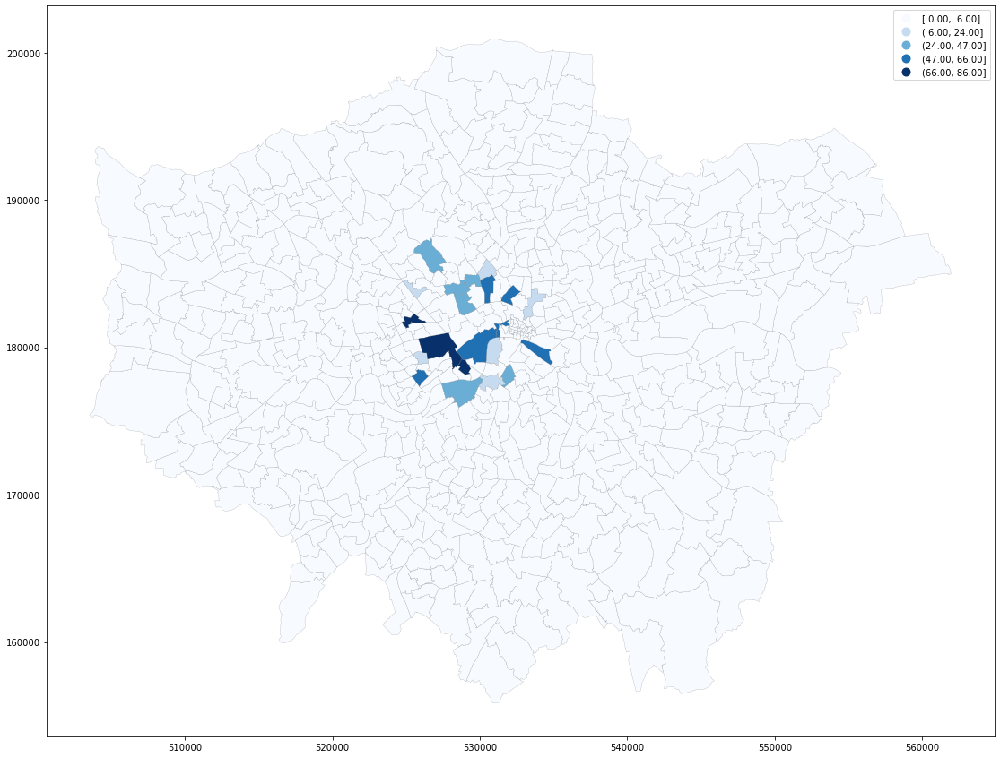

In [125]:
flow.plot(column='sum_ward',cmap='Blues', scheme='FisherJenks',
               figsize=(25, 15),linewidth=0.2, edgecolor='grey',legend=True)
# plt.savefig('health.png',dpi=100)

In [83]:
# # adj_matrix = nx.adjacency_matrix(g_OD)
# adj_matrix = nx.to_numpy_matrix(g_OD,weight='weight')
# matrix=pd.DataFrame(adj_matrix)

In [84]:
# matrix['Total'] = matrix.sum(axis=1)
# matrix.loc['Total']= matrix.sum()
# matrix

### glasgow

In [143]:
# load in ward data
glasgow_district = gpd.read_file(f"data/BoundaryData/scotland_pcd_2012.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
glasgow_district=glasgow_district.to_crs('epsg:27700')
glasgow_district.crs

<AxesSubplot:>

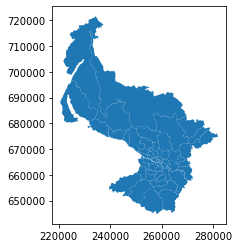

In [129]:
glasgow_district.plot()

In [148]:
glasgow_district.head(3)

,name,label,geometry
0,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
1,None,G34,"POLYGON ((267042.709 667535.799, 267038.562 66..."
2,None,G41,"POLYGON ((254286.989 662236.986, 254305.013 66..."


<AxesSubplot:>

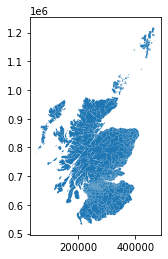

In [130]:
scottish_wards = gpd.read_file(f"data/Scotland_wa_2001/scotland_wa_2001.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
scottish_wards=scottish_wards.to_crs('epsg:27700')
scottish_wards.plot()

In [149]:
scottish_wards.head(3)

,name,label,geometry
0,Ardnamurchan and Morvern,1876,"POLYGON ((201177.722 764152.636, 201187.187 76..."
1,Kilmallie and Invergarry,1874,"POLYGON ((207736.000 776567.000, 207647.000 77..."
2,Highland,3017,"POLYGON ((257956.980 733438.512, 257967.439 73..."


In [141]:
Glasgow=scottish_wards[scottish_wards.name=='Glasgow City']
Glasgow

,name,label,geometry


<AxesSubplot:>

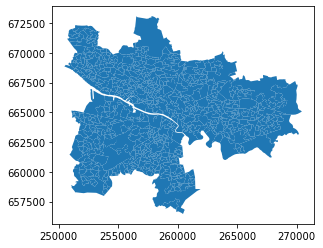

In [145]:
# load in ward data
Glasgow_Population = gpd.read_file(f"data/Glasgow_Population/Glasgow_Population.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
Glasgow_Population=Glasgow_Population.to_crs('epsg:27700')
Glasgow_Population.plot()

In [146]:
Glasgow_Population

,DataZone,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,Area_name,Council_ar,Population,geometry
0,S01009758,7.849029,0.078491,1474.152028,78490.309008,Darnley East - 01,Glasgow City,597.0,"POLYGON ((254366.687 658648.165, 254302.649 65..."
1,S01009759,13.609150,0.136092,2170.701472,136091.515542,Darnley East - 02,Glasgow City,874.0,"POLYGON ((254197.000 660082.000, 254187.000 66..."
2,S01009760,33.234507,0.332345,3057.747139,332345.088422,Darnley East - 03,Glasgow City,818.0,"POLYGON ((254419.100 659330.500, 254431.196 65..."
3,S01009761,15.607803,0.156078,2761.244322,156078.015080,Darnley East - 04,Glasgow City,804.0,"POLYGON ((254085.000 658830.000, 254073.000 65..."
4,S01009762,15.073786,0.150739,2295.018993,150737.851165,Darnley East - 05,Glasgow City,1266.0,"POLYGON ((253971.926 659497.041, 253975.149 65..."
...,...,...,...,...,...,...,...,...,...
741,S01010499,24.494158,0.244941,2645.822578,244941.600066,Drumry East - 04,Glasgow City,793.0,"POLYGON ((251775.000 671648.000, 251833.000 67..."
742,S01010500,21.830305,0.218304,2793.013024,218303.033646,Drumry West - 01,Glasgow City,984.0,"POLYGON ((251511.000 671262.000, 251522.001 67..."
743,S01010501,23.383030,0.233831,3413.705002,233830.299216,Drumry West - 02,Glasgow City,1124.0,"POLYGON ((251627.000 671643.000, 251610.000 67..."
744,S01010502,24.142424,0.241424,2732.532929,241424.225068,Drumry West - 03,Glasgow City,788.0,"POLYGON ((251100.354 672000.127, 251110.987 67..."


In [ ]:
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
points = gpd.read_file('points.shp')
xmin,ymin,xmax,ymax =  points.total_bounds
width = 2000
height = 1000
rows = int(np.ceil((ymax-ymin) /  height))
cols = int(np.ceil((xmax-xmin) / width))
XleftOrigin = xmin
XrightOrigin = xmin + width
YtopOrigin = ymax
YbottomOrigin = ymax- height
polygons = []
for i in range(cols):
    Ytop = YtopOrigin
    Ybottom =YbottomOrigin
    for j in range(rows):
        polygons.append(Polygon([(XleftOrigin, Ytop), (XrightOrigin, Ytop), (XrightOrigin, Ybottom), (XleftOrigin, Ybottom)])) 
        Ytop = Ytop - height
        Ybottom = Ybottom - height
    XleftOrigin = XleftOrigin + width
    XrightOrigin = XrightOrigin + width
    
grid = gpd.GeoDataFrame({'geometry':polygons})
grid.to_file("grid.shp")

In [ ]:
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
points = gpd.read_file('points.shp')

xmin, ymin, xmax, ymax = points.total_bounds

length = 1000
wide = 1200

cols = list(np.arange(xmin, xmax + wide, wide))
rows = list(np.arange(ymin, ymax + length, length))

polygons = []
for x in cols[:-1]:
    for y in rows[:-1]:
        polygons.append(Polygon([(x,y), (x+wide, y), (x+wide, y+length), (x, y+length)]))

grid = gpd.GeoDataFrame({'geometry':polygons})
grid.to_file("grid.shp")